**<center><h1>Evaluating Florence-2-large Vision Model on Real-World Billboard and Panel Images under Various Conditions</h1></center>**

In this notebook, we evaluate the performance of the Florence-2-large vision model on a diverse set of real-world images primarily featuring billboards and panels. These images were captured under various challenging conditions, including different lighting scenarios (normal, bright, and dark), the presence of small text, and varying angles. The aim is to assess how well the model handles these practical challenges, providing insights into its robustness and applicability in real-world settings. This evaluation will help determine the strengths and potential areas for improvement of Florence-2-large in recognizing and interpreting complex visual information from real-world scenes.

### **Table of Contents**

* [Step 1. Install Libraries](#section-one)
* [Step 2. Import Libraries](#section-two)
* [Step 3. Load Florence-2-large Model](#section-three)
* [Step 4. OCR for images from Different Situations](#section-four)
    * [Normal Images](#section-five)
    * [Bright Images](#section-six)
    * [Dark Images](#section-seven)
    * [Images Taken from Different Angles](#section-eight)
    * [Images with Small Size Text](#section-nine)
* [Step 5. Conclusion](#section-ten)

## **Step 1. Install Libraries** <a id="section-one"></a>

In [1]:
! pip install einops flash_attn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 23.6 MB/s eta 0:00:0000:0100:01
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 1.9 MB/s eta 0:00:00
  Created wheel for flash_attn: filename=flash_attn-2.5.9.post1-cp310-cp310-linux_x86_64.whl size=120576656 sha256=0f3dddbf9bc350ea6b0306ec5ca5fee71b57fe1f06e6b72672690793d9dad2ce
  Stored in directory: /root/.cache/pip/wheels/cc/ad/f6/7ccf0238790d6346e9fe622923a76ec218e890d356b9a2754a
Successfully built flash_attn


## **Step 2. Import Libraries** <a id="section-two"></a>

In [2]:
import torch
import requests
from PIL import Image, ImageDraw, ImageFont
from transformers import AutoProcessor, AutoModelForCausalLM
from IPython.display import display, Markdown, Latex
import copy
import random
import numpy as np

2024-06-29 10:24:19.663067: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-29 10:24:19.663183: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-29 10:24:19.792865: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## **Step 3. Load Florence-2-large Model** <a id="section-three"></a>

In [3]:
model = AutoModelForCausalLM.from_pretrained("microsoft/Florence-2-large", trust_remote_code=True)
processor = AutoProcessor.from_pretrained("microsoft/Florence-2-large", trust_remote_code=True)

config.json:   0%|          | 0.00/2.44k [00:00<?, ?B/s]

configuration_florence2.py:   0%|          | 0.00/15.1k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large:
- configuration_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


modeling_florence2.py:   0%|          | 0.00/127k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large:
- modeling_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


pytorch_model.bin:   0%|          | 0.00/1.54G [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/torch/_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()


generation_config.json:   0%|          | 0.00/51.0 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

processing_florence2.py:   0%|          | 0.00/46.4k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large:
- processing_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


tokenizer_config.json:   0%|          | 0.00/34.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.10M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

## **Step 4. OCR for images from Different Situations** <a id="section-four"></a>

First, let's define some functions to use later in the next subsections.

In [4]:
colormap = ['black']

In [5]:
def extract_text_from_images(image_to_process):
    prompt = '<OCR_WITH_REGION>'
    inputs = processor(text=prompt, images=image_to_process, return_tensors="pt")
    generated_ids = model.generate(
        input_ids=inputs["input_ids"],
        pixel_values=inputs["pixel_values"],
        max_new_tokens=4096,
        num_beams=3
    )
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]
    parsed_answer = processor.post_process_generation(generated_text, task=prompt, image_size=(image.width, image.height))
    return parsed_answer

In [6]:
def draw_ocr_bboxes(image_processed, prediction, scale_factor=2):
    # create a new white image of the same size as the original image
    new_image = Image.new('RGB', image_processed.size, color='white')
    draw_original = ImageDraw.Draw(image_processed)
    draw = ImageDraw.Draw(new_image)
    bboxes, labels = prediction['quad_boxes'], prediction['labels']
    for box, label in zip(bboxes, labels):
        #color = random.choice(colormap)
        new_box = (np.array(box)).tolist()
        #draw.polygon(new_box, width=3, outline='red')
        draw_original.polygon(new_box, width=3, outline='red')
        draw.text((new_box[0] + 8, new_box[1] + 2),
                  "{}".format(label),
                  align="right",
                  fill='red')
    
    # combine the original and new images side by side
    combined_image = Image.new('RGB', (image_processed.width * 2, image_processed.height))
    combined_image.paste(image, (0, 0))
    combined_image.paste(new_image, (image_processed.width, 0))
    # Resize the combined images
    resized_image = combined_image.resize((combined_image.width * scale_factor, combined_image.height * scale_factor))
    # display the combined images
    display(resized_image)

### **Normal Images** <a id="section-five"></a>

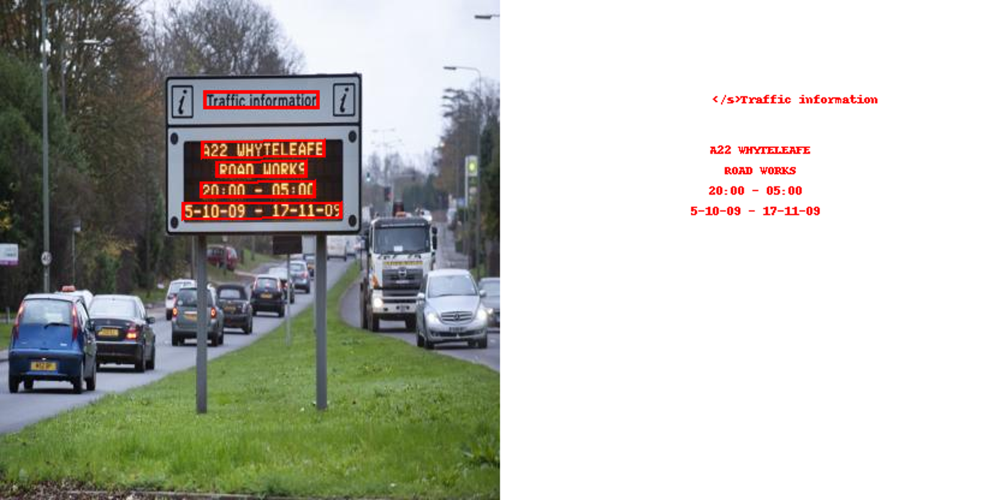

CPU times: user 35.4 s, sys: 3.07 s, total: 38.5 s
Wall time: 19.6 s


In [10]:
%%time
path_image = "/kaggle/input/images-different-conditions-for-ocr/normal images/4540076b317e318c_jpg.rf.ed7b88e410f61dbb2dcd8bd08a8b4972.jpg"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])

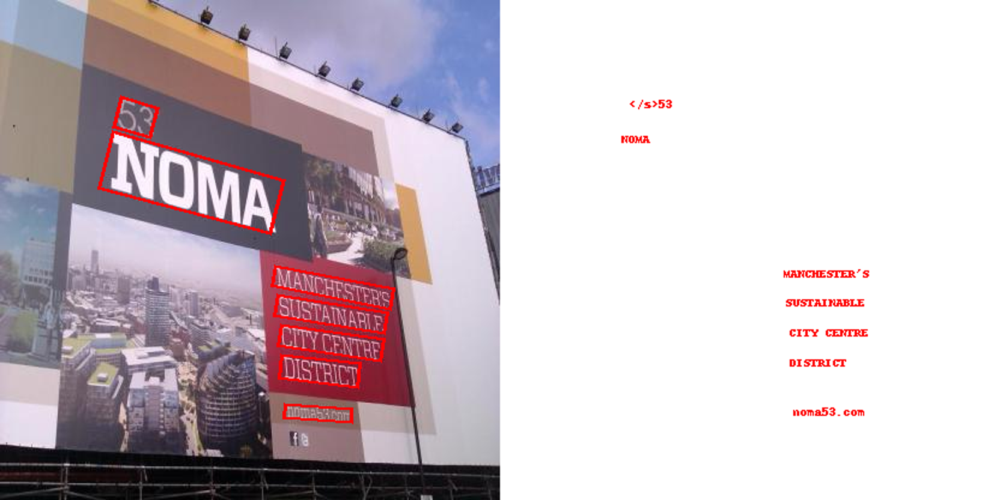

CPU times: user 35.6 s, sys: 1.6 s, total: 37.2 s
Wall time: 18.8 s


In [11]:
%%time
path_image = "/kaggle/input/images-different-conditions-for-ocr/normal images/4816ecfe738eb35e_jpg.rf.b63692547c5bef3dd7d7aa137c5eeb04.jpg"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])

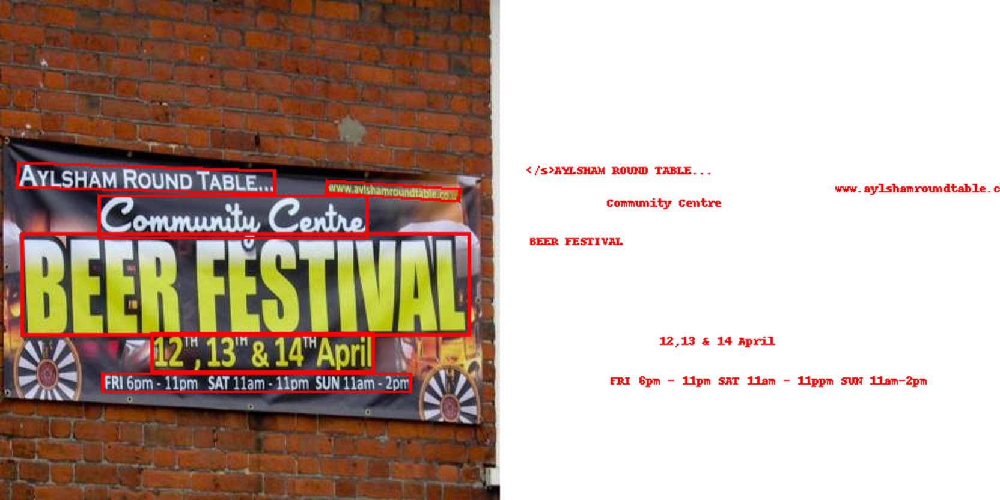

CPU times: user 40.4 s, sys: 3.35 s, total: 43.7 s
Wall time: 22.3 s


In [12]:
%%time
path_image = "/kaggle/input/images-different-conditions-for-ocr/normal images/a70208a69db49a2d_jpg.rf.d071190b9bc86b44137fd4efb8461a03.jpg"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])

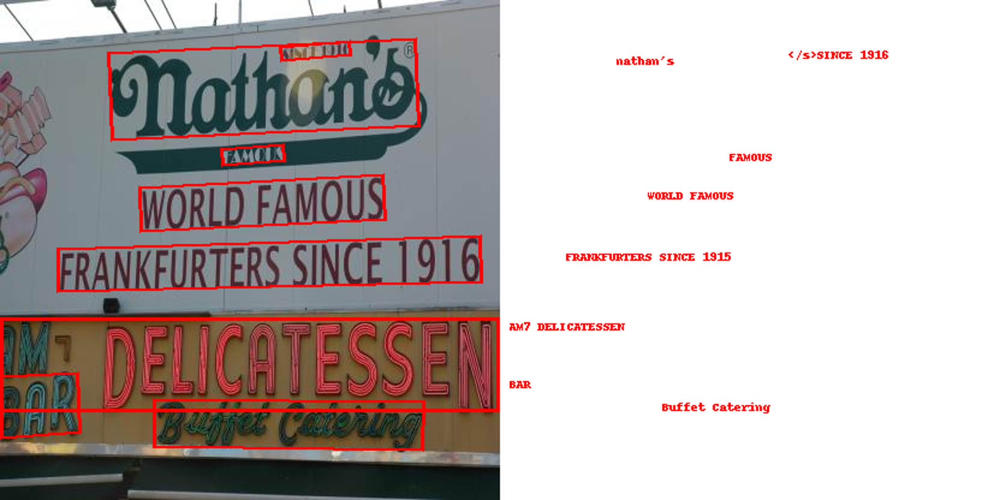

CPU times: user 40.2 s, sys: 3.17 s, total: 43.4 s
Wall time: 21.9 s


In [14]:
%%time
path_image = "/kaggle/input/images-different-conditions-for-ocr/normal images/c3db6b84ef6e4567_jpg.rf.b586041466ac0a5440ac788478d0c149.jpg"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])

### **Bright Images** <a id="section-six"></a>

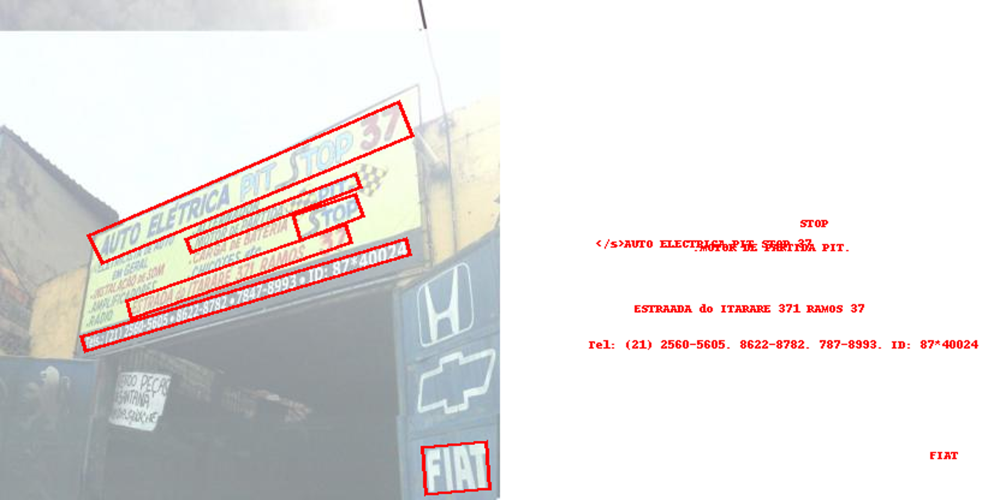

CPU times: user 55.6 s, sys: 1.56 s, total: 57.2 s
Wall time: 28.8 s


In [15]:
%%time
path_image = "/kaggle/input/images-different-conditions-for-ocr/bright images/203ccd184cfe8eda_jpg.rf.e019c8734167e9c2f1b068248ec44c3b.jpg"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])

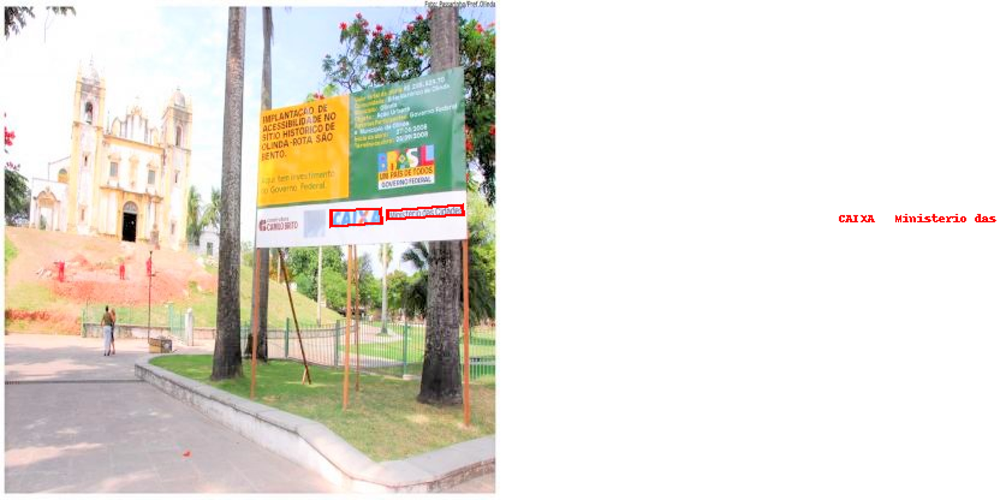

CPU times: user 41.6 s, sys: 2.03 s, total: 43.6 s
Wall time: 22.1 s


In [16]:
%%time
path_image = "/kaggle/input/images-different-conditions-for-ocr/bright images/577351b6767772d1_jpg.rf.c690160441a03df4a4d905efd336b20d.jpg"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])

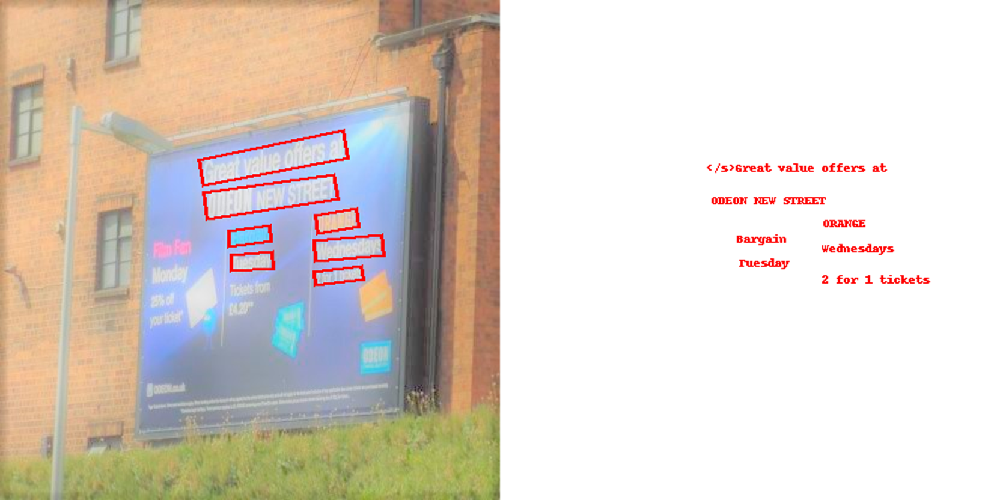

CPU times: user 38.4 s, sys: 1.04 s, total: 39.5 s
Wall time: 20.1 s


In [17]:
%%time
path_image = "/kaggle/input/images-different-conditions-for-ocr/bright images/85800ea6436b6b94_jpg.rf.139fb195c5985b0cc5315eccfbcd52a6.jpg"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])

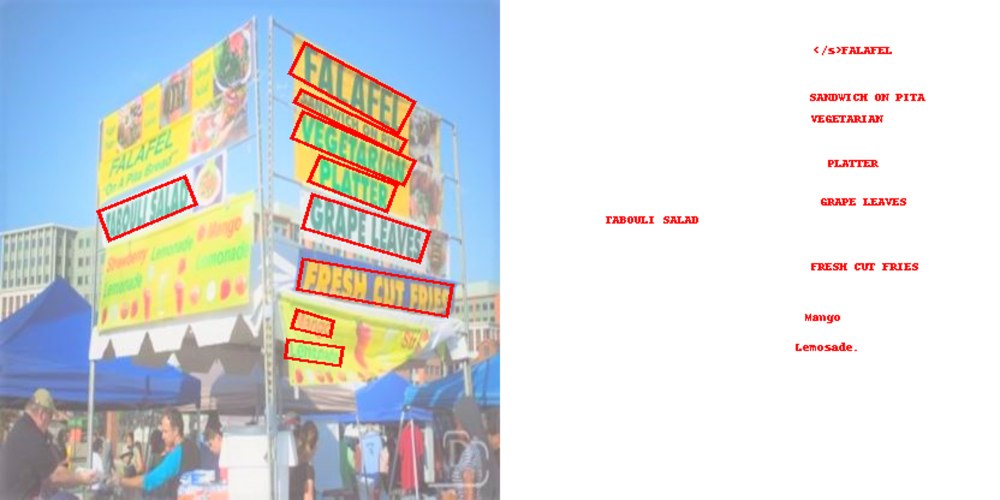

CPU times: user 47.5 s, sys: 2.42 s, total: 49.9 s
Wall time: 25.2 s


In [18]:
%%time
path_image = "/kaggle/input/images-different-conditions-for-ocr/bright images/a9dbe6c91266a5d5_jpg.rf.a5264d8885c91179ad3c49a7f5bb3fd4.jpg"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])

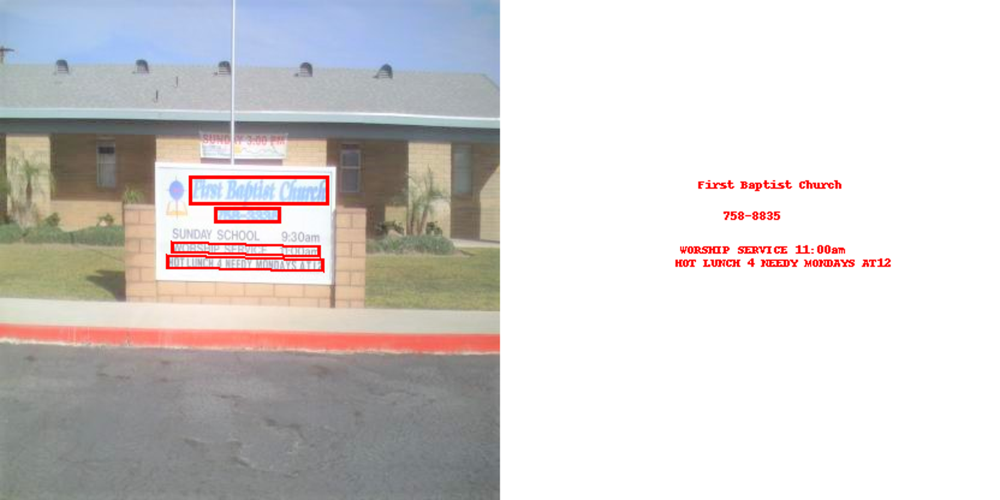

CPU times: user 39.4 s, sys: 883 ms, total: 40.2 s
Wall time: 20.3 s


In [19]:
%%time
path_image = "/kaggle/input/images-different-conditions-for-ocr/bright images/d08e8db9e1f90c8a_jpg.rf.eb6cfc9c42aa1d528590aafbcb2b86be.jpg"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])

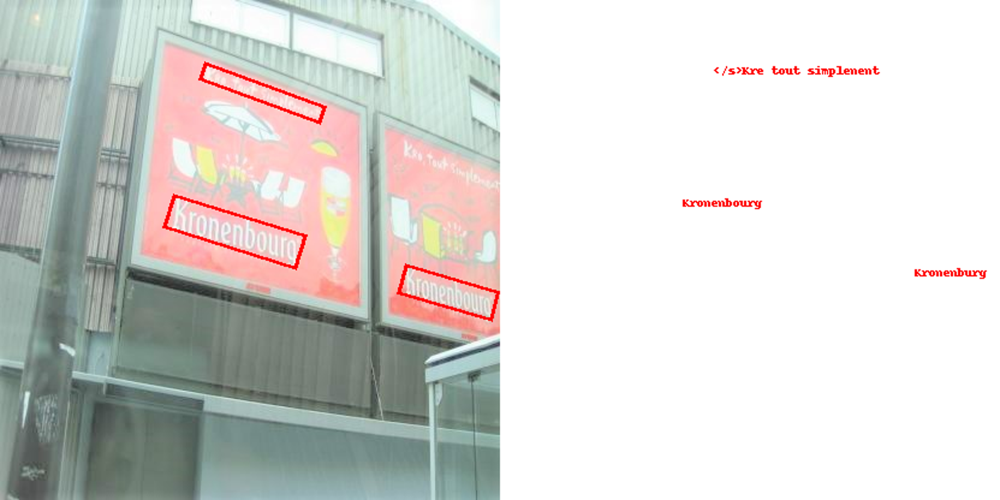

CPU times: user 28.3 s, sys: 452 ms, total: 28.8 s
Wall time: 14.6 s


In [20]:
%%time
path_image = "/kaggle/input/images-different-conditions-for-ocr/bright images/ddb1ee2191a761ab_jpg.rf.9086568eb1499b3e3cd124958167af8b.jpg"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])

### **Dark Images** <a id="section-seven"></a>

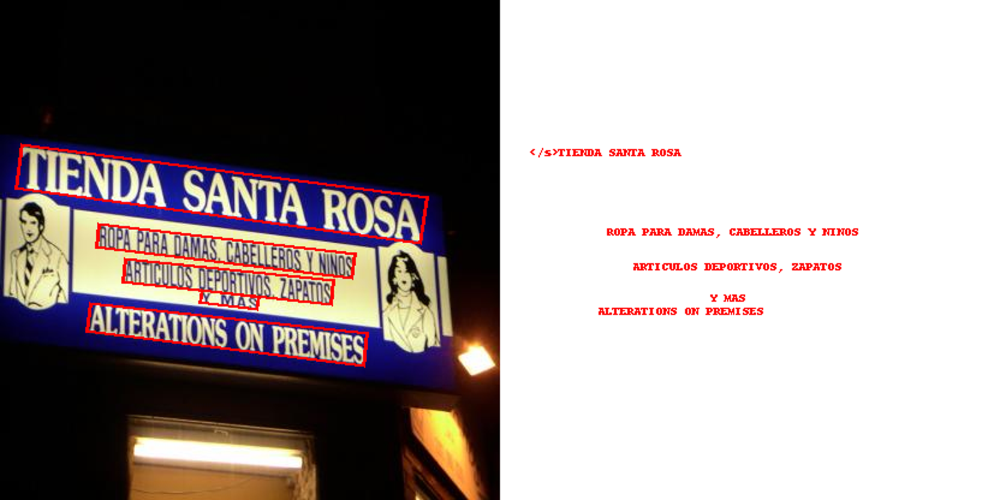

CPU times: user 36.6 s, sys: 1.02 s, total: 37.6 s
Wall time: 19 s


In [21]:
%%time
path_image = "/kaggle/input/images-different-conditions-for-ocr/dark images/37ef7cd6e5ab3f48_jpg.rf.1c63407bbc72c828f80fb0ef8509d849.jpg"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])

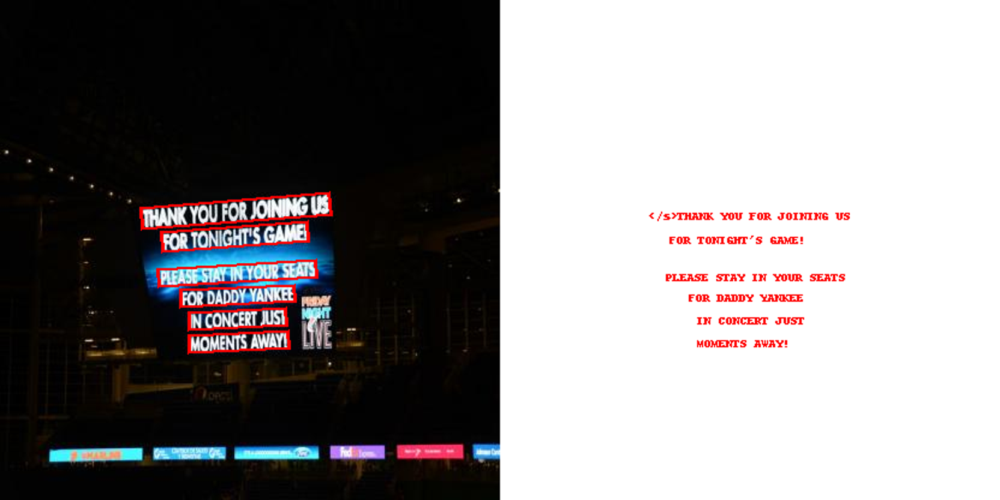

CPU times: user 36.6 s, sys: 787 ms, total: 37.4 s
Wall time: 18.9 s


In [22]:
%%time
path_image = "/kaggle/input/images-different-conditions-for-ocr/dark images/37f5d46497564d83_jpg.rf.e0f120aa8ed7f01e5d5923b7beadc201.jpg"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])

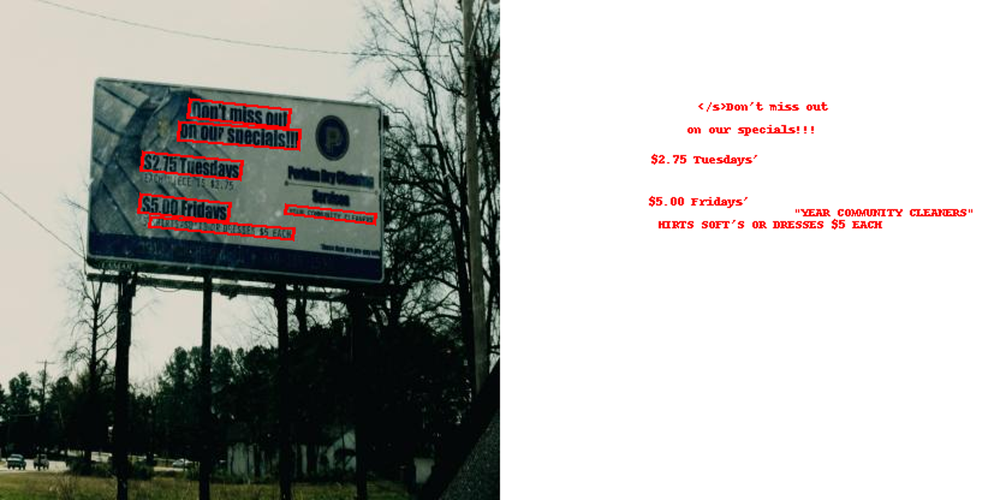

CPU times: user 38.2 s, sys: 1.1 s, total: 39.3 s
Wall time: 19.8 s


In [23]:
%%time
path_image = "/kaggle/input/images-different-conditions-for-ocr/dark images/8b5d457bdaa7c367_jpg.rf.86061887218f4fc9fc3297bce64cabb8.jpg"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])

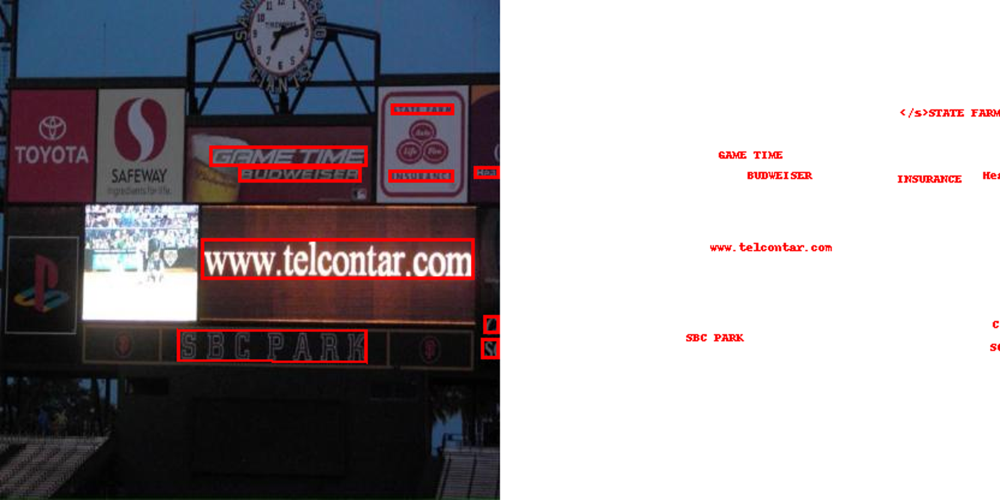

CPU times: user 42.5 s, sys: 850 ms, total: 43.3 s
Wall time: 21.9 s


In [24]:
%%time
path_image = "/kaggle/input/images-different-conditions-for-ocr/dark images/9fced37a4a3430fa_jpg.rf.be313621c58f66d789d9ce282b2883a7.jpg"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])

### **Images Taken from Different Angles** <a id="section-eight"></a>

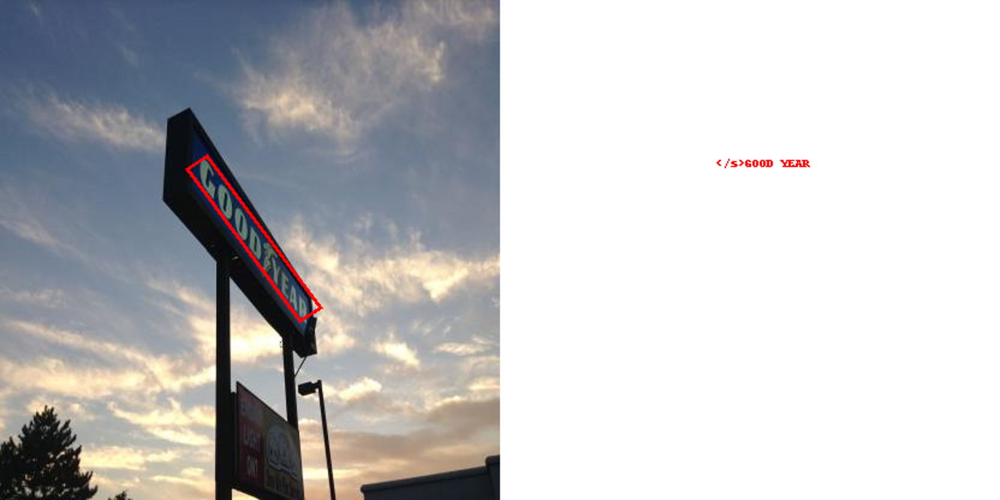

CPU times: user 23.8 s, sys: 770 ms, total: 24.6 s
Wall time: 12.5 s


In [25]:
%%time
path_image = "/kaggle/input/images-different-conditions-for-ocr/different angles/0048ed25da02e036_jpg.rf.94c5b4a4eb295a1f37def74618c4338f.jpg"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])

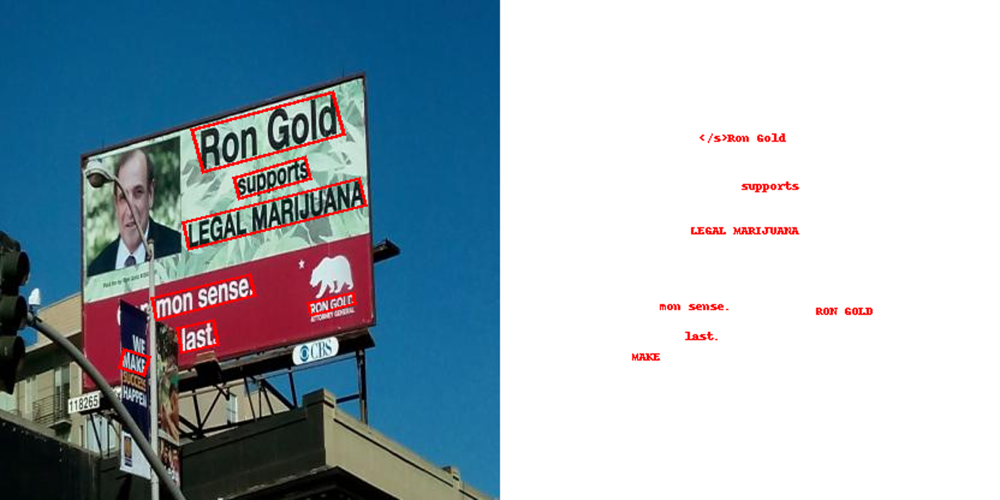

CPU times: user 40.2 s, sys: 775 ms, total: 40.9 s
Wall time: 20.7 s


In [26]:
%%time
path_image = "/kaggle/input/images-different-conditions-for-ocr/different angles/28cddfb2e56450b2_jpg.rf.06289e93a916e0552dbf5ab005e17b5a.jpg"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])

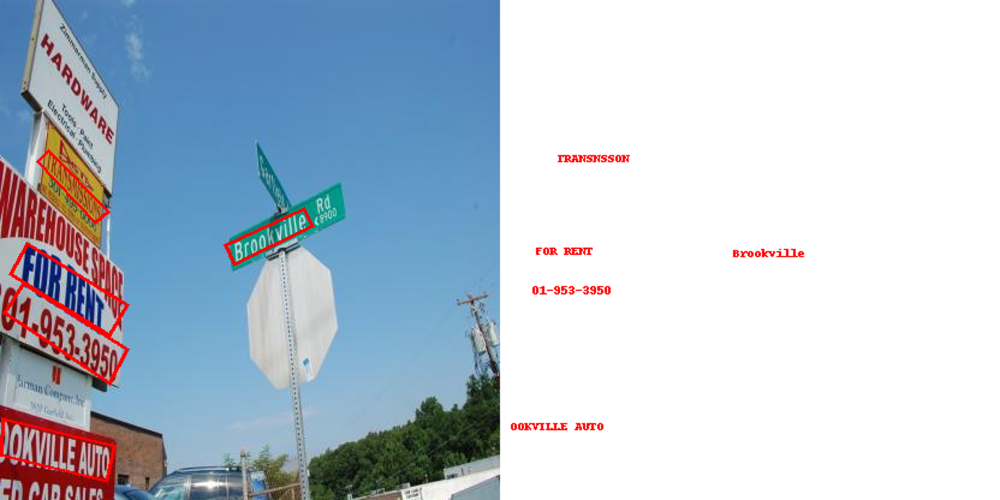

CPU times: user 42.7 s, sys: 749 ms, total: 43.5 s
Wall time: 21.9 s


In [27]:
%%time
path_image = "/kaggle/input/images-different-conditions-for-ocr/different angles/8fce96cfb3821f90_jpg.rf.51fc22fcd2af87153049d475fbf1f2db.jpg"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])

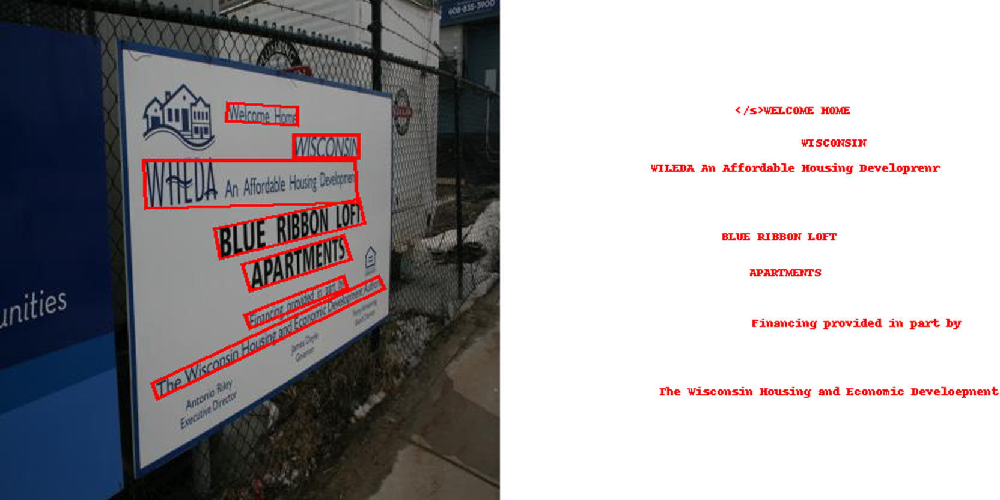

CPU times: user 46.9 s, sys: 1.16 s, total: 48.1 s
Wall time: 24.2 s


In [28]:
%%time
path_image = "/kaggle/input/images-different-conditions-for-ocr/different angles/a27d7f55f736d6d3_jpg.rf.eca51e41705b17acf813c718332f4f8c.jpg"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])

### **Images with Small Size Text** <a id="section-nine"></a>

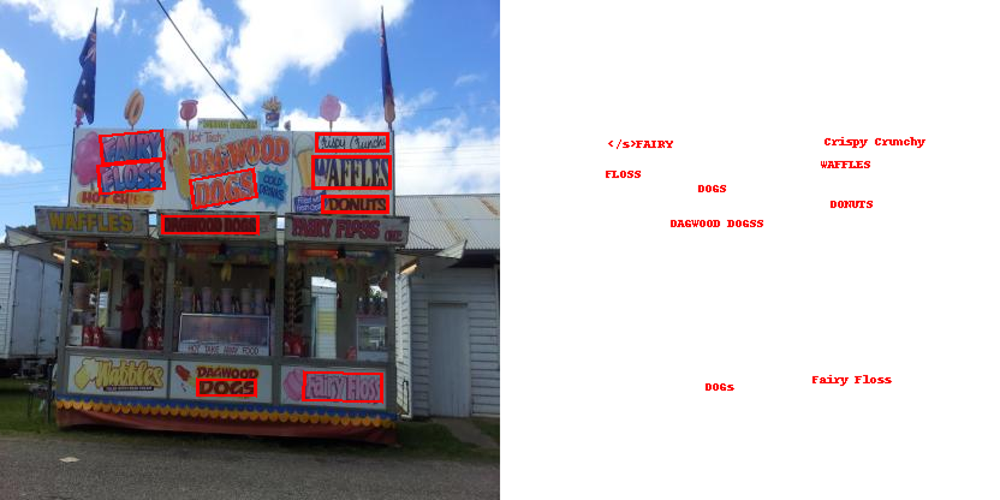

CPU times: user 48.5 s, sys: 843 ms, total: 49.4 s
Wall time: 24.9 s


In [29]:
%%time
path_image = "/kaggle/input/images-different-conditions-for-ocr/small text images/143d0e75db542e8c_jpg.rf.ed9a295d57ab14c77619c4b6abe48fdd.jpg"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])

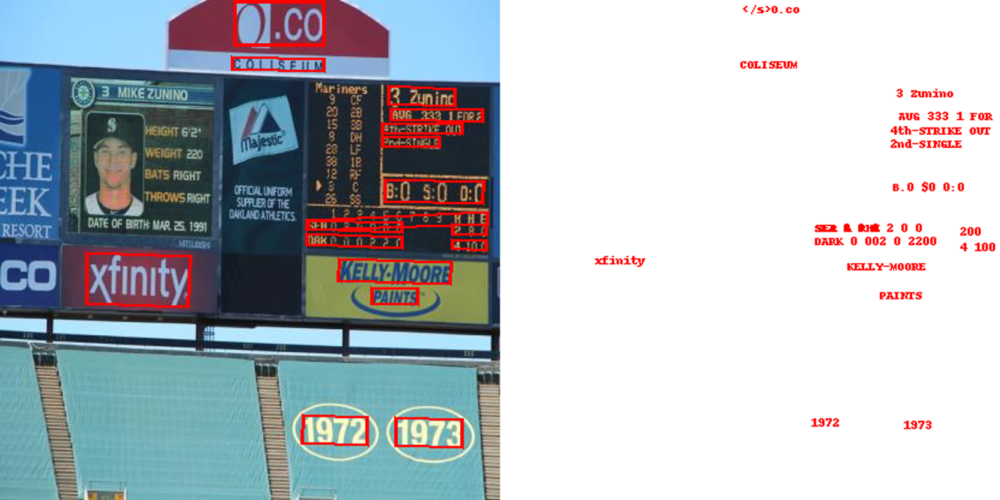

CPU times: user 1min 43s, sys: 1.14 s, total: 1min 44s
Wall time: 52.7 s


In [30]:
%%time
path_image = "/kaggle/input/images-different-conditions-for-ocr/small text images/651d67902afca19f_jpg.rf.ab1f281b20b2503d69e321ade4d47a83.jpg"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])

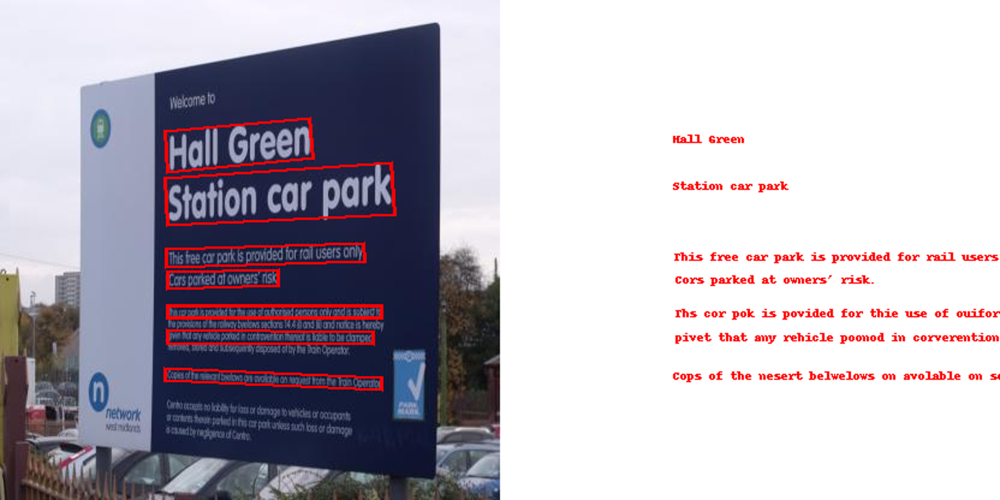

CPU times: user 54.7 s, sys: 858 ms, total: 55.6 s
Wall time: 28 s


In [31]:
%%time
path_image = "/kaggle/input/images-different-conditions-for-ocr/small text images/c3978d72d26e32a7_jpg.rf.203f8f54701353f6ada4a23314db4d94.jpg"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])

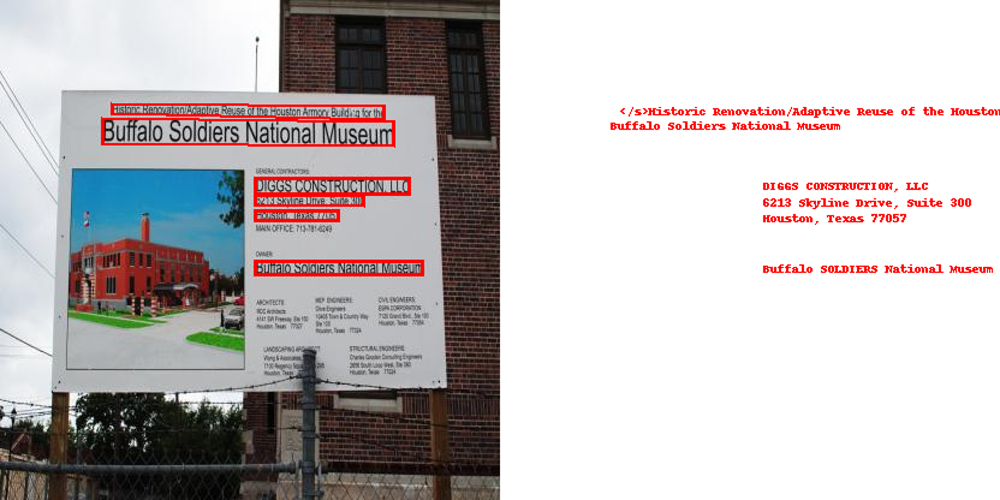

CPU times: user 42.2 s, sys: 829 ms, total: 43 s
Wall time: 21.7 s


In [32]:
%%time
path_image = "/kaggle/input/images-different-conditions-for-ocr/small text images/c44d692119e24ffc_jpg.rf.eeffdae75c98521d417e9927e1ccf495.jpg"
image = Image.open(path_image).convert("RGB")
parsed_answer_obtained = extract_text_from_images(image)
draw_ocr_bboxes(image, parsed_answer_obtained['<OCR_WITH_REGION>'])

## **Step 5. Conclusion** <a id="section-ten"></a>

<div style="color:white;
           display:fill;
           border-radius:5px;
           background-color:#5642C5;
           font-size:110%;
           font-family:Roboto;
           letter-spacing:0.5px">

<p style="padding: 10px;
              color:white;">
              The Florence-2-large vision model generates acceptable results across various challenging scenarios, including different lighting conditions, small text, and diverse angles. Notably, the model successfully extracts text in multiple languages beyond English, demonstrating its versatility. For instances where text extraction is less effective, applying upscaling techniques may enhance the quality and readability of the text, potentially improving the model's performance further.
</p>
</div>
